In [1]:
import json
import glob
import random

import geopandas
import plotly.graph_objects as go
import numpy as np
import pandas as pd
import matplotlib


SHP_INPUT_PATH = './data/treesAsPoints/stromy.shp'
JSON_OUTPUT_PATH = './data/treesAsPoints/stromy.geojson'

In [2]:
%matplotlib inline

In [ ]:
# shp_file = geopandas.read_file(SHP_INPUT_PATH)
# shp_file.to_crs('EPSG:4326').to_file(JSON_OUTPUT_PATH, driver='GeoJSON')

In [3]:
with open(JSON_OUTPUT_PATH, 'r') as f:
    trees_geojson = json.load(f)

In [4]:
trees_geojson_sample = trees_geojson.copy()
trees_geojson_sample["features"] = random.sample(trees_geojson["features"], 10000)

In [5]:
fig = go.Figure(go.Scattermapbox())

fig.update_layout(
    mapbox = {
        'style': "carto-positron",
        'center': {
            'lon': 17.1077, 
            'lat': 48.1486
        },
        'zoom': 11, 
        'layers': [
            {
                'sourcetype': 'geojson',
                'source': trees_geojson_sample,
                'type': 'circle',
                'color': 'rgba(50,205,50, 0.75)',
                'circle': {
                    'radius': 3
                },
            },
        ]
    },
    margin = {'l':0, 'r':0, 'b':0, 't':0},
)

fig.show(hoverinfo='lon+lat')

In [ ]:
step = 0.00001
co2_multiplier = 1.3
to_bin = lambda x: np.floor(x / step) * step


path = './data/bus/' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

bus = pd.concat(li, axis=0, ignore_index=True)

# bus = pd.read_csv('./data/bus/CLIMATHON_BUSES_01_2019_BRATISLAVA_BUSES.csv')

# Convert data types to float
bus["LAT"] = bus["LAT"].str.replace(',', '.').astype(float)
bus["LON"] = bus["LON"].str.replace(',', '.').astype(float)

# Create lat/lon bins to group close points
bus["latbin"] = bus.LAT.map(to_bin)
bus["lonbin"] = bus.LON.map(to_bin)

# Groupby close lat/lon points
groups = bus.groupby(by=["latbin", "lonbin"])
result = groups.count()

# Calculate "co2" for a given map point and reset index
result["co2"] = result['DATE'] * co2_multiplier
result.reset_index(inplace=True)

In [ ]:
step = 0.0001
co2_multiplier = 1.3
to_bin = lambda x: np.floor(x / step) * step

# Create lat/lon bins to group close points
bus["latbin"] = bus.LAT.map(to_bin)
bus["lonbin"] = bus.LON.map(to_bin)

# Groupby close lat/lon points
groups = bus.groupby(by=["latbin", "lonbin"])
result = groups.count()

# Calculate "co2" for a given map point and reset index
result["co2"] = result['DATE'] * co2_multiplier
result.reset_index(inplace=True)

result.count()

In [ ]:
result

In [ ]:
fig = go.Figure(
    go.Densitymapbox(
        lat=result.latbin, lon=result.lonbin, z=result.co2, radius=10
    )
)
fig.update_layout(
    mapbox={
        'style': 'carto-positron',
        'zoom': 11,
        'center': {
            'lon': 17.1077, 
            'lat': 48.1486
        },
        'layers': [
#             {
#                 'sourcetype': 'geojson',
#                 'source': trees_geojson_sample,
#                 'type': 'circle',
#                 'color': 'rgba(50,205,50, 0.5)',
#                 'circle': {
#                     'radius': 3
#                 },
#             },
        ]
    }
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Load bus lines as a spatial data and calculate carbon emissions per year

In [6]:
df = geopandas.read_file('./data/bus/bus_lines.geojson')
df.head()

,osm_id,name,type,other_tags,geometry
0,17206,Donauradweg,route,"""description""=>""Alle Abschnitte des Donauradwe...","MULTILINESTRING ((16.99620 48.14642, 16.99650 ..."
1,37872,D1,route,"""name:cs""=>""Dálnice D1 (Slovensko)"",""name:en""=...","MULTILINESTRING ((17.08429 48.12854, 17.08565 ..."
2,38441,E 575,route,"""description:fr""=>""E 575 Bratislava - Győr"",""n...","MULTILINESTRING ((17.18006 48.15011, 17.18027 ..."
3,52081,None,route,"""colour""=>""yellow"",""complete""=>""no"",""network""=...","MULTILINESTRING ((17.25917 48.18908, 17.25945 ..."
4,63311,S7: Laa an der Thaya => Wolfsthal,route,"""colour""=>""#EC1093"",""from""=>""Laa an der Thaya""...","MULTILINESTRING ((17.00559 48.13575, 17.00619 ..."


<AxesSubplot:>

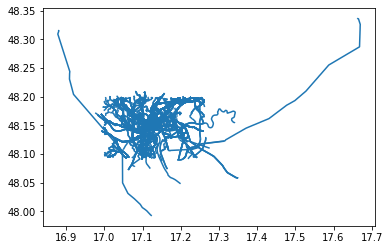

In [7]:
df.plot()

In [ ]:
df[df["name"] == "Bus 92: Vozovňa Petržalka => Opletalova, VW5 => Jána Jonáša, VW1"].to_crs("epsg:4326").length

In [ ]:
df.length

In [8]:
from geojson_length import calculate_distance, Unit
from geojson import MultiLineString
import geojson

In [9]:
with open('./data/bus/bus_lines.geojson', 'r') as f:
    bus_geojson = geojson.load(f)

In [11]:
# Keep only bus lines
bus_lines_only = [x for x in bus_geojson.features if 'bus' in str(x.properties['name']).lower()]

df = pd.DataFrame()
columns = ['name', 'LON', 'LAT', 'distance_total_meters']
for feature in bus_lines_only:
    distance_meters = calculate_distance(feature, Unit.meters)
    
    cnt = 0
    array = []
    for line_string in feature.geometry.coordinates:
        for lon_lat in line_string:
            array.append([
                feature.properties['name'], lon_lat[0], lon_lat[1], distance_meters
            ])
            cnt = cnt + 1
            
    partial_df = pd.DataFrame(array, columns=columns)
    partial_df['co2'] = (distance_meters * 0.0013) / cnt
    df = pd.concat([df, partial_df])

In [12]:
df

,name,LON,LAT,distance_total_meters,co2
0,Bus 79: Čiližská => Lieskovec => Topoľové,17.211972,48.145029,9793.763138,0.033952
1,Bus 79: Čiližská => Lieskovec => Topoľové,17.211717,48.145366,9793.763138,0.033952
2,Bus 79: Čiližská => Lieskovec => Topoľové,17.211629,48.145485,9793.763138,0.033952
3,Bus 79: Čiližská => Lieskovec => Topoľové,17.211488,48.145671,9793.763138,0.033952
4,Bus 79: Čiližská => Lieskovec => Topoľové,17.211437,48.145736,9793.763138,0.033952
...,...,...,...,...,...
356,Bus 79: Čiližská => Lieskovec,17.200386,48.107278,8637.521615,0.031105
357,Bus 79: Čiližská => Lieskovec,17.200386,48.107278,8637.521615,0.031105
358,Bus 79: Čiližská => Lieskovec,17.200380,48.107208,8637.521615,0.031105
359,Bus 79: Čiližská => Lieskovec,17.199109,48.103936,8637.521615,0.031105


In [21]:
step = 0.00001
to_bin = lambda x: np.floor(x / step) * step

# Create lat/lon bins to group close points
df["latbin"] = df.LAT.map(to_bin)
df["lonbin"] = df.LON.map(to_bin)

# Groupby close lat/lon points
groups = df.groupby(by=["latbin", "lonbin"])
result = groups.sum()
result.reset_index(inplace=True)

result["co2_per_year"] = result["co2"] * 10 * 365
result

,latbin,lonbin,LON,LAT,distance_total_meters,co2,co2_per_year
0,48.09020,17.09896,290.682354,817.533468,361417.186945,0.691677,2524.619606
1,48.09082,17.09879,290.679498,817.544110,351418.664671,0.702910,2565.622523
2,48.09132,17.09896,290.682439,817.552559,361417.186945,0.691677,2524.619606
3,48.09153,17.19467,34.389352,96.183070,19583.097507,0.073971,269.994163
4,48.09159,17.19465,34.389308,96.183186,19583.097507,0.073971,269.994163
...,...,...,...,...,...,...,...
15874,48.20076,17.07760,17.077606,48.200768,4272.841464,0.029390,107.273189
15875,48.20099,17.20544,34.410888,96.401984,4829.228780,0.120731,440.667126
15876,48.20108,17.07708,17.077084,48.201085,4272.841464,0.029390,107.273189
15877,48.20129,17.07677,17.076778,48.201295,4272.841464,0.029390,107.273189


In [32]:
cnt_trees = len(trees_geojson['features'])
trees_co2_sequestration = cnt_trees * 22
trees_co2_sequestration_per_point = trees_co2_sequestration / len(result)
trees_co2_sequestration_per_point

120.37307135210025

In [35]:
result["co2_per_year_with_trees"] = result["co2_per_year"] - trees_co2_sequestration_per_point
result["co2_per_year_with_trees"][result["co2_per_year_with_trees"] < 0] = 0

result["co2_per_year_with_trees_doubled"] = result["co2_per_year"] - trees_co2_sequestration_per_point * 10
result["co2_per_year_with_trees_doubled"][result["co2_per_year_with_trees_doubled"] < 0] = 0

result

,latbin,lonbin,LON,LAT,distance_total_meters,co2,co2_per_year,co2_per_year_with_trees,co2_per_year_with_trees_doubled
0,48.09020,17.09896,290.682354,817.533468,361417.186945,0.691677,2524.619606,2404.246535,1320.888893
1,48.09082,17.09879,290.679498,817.544110,351418.664671,0.702910,2565.622523,2445.249452,1361.891809
2,48.09132,17.09896,290.682439,817.552559,361417.186945,0.691677,2524.619606,2404.246535,1320.888893
3,48.09153,17.19467,34.389352,96.183070,19583.097507,0.073971,269.994163,149.621092,0.000000
4,48.09159,17.19465,34.389308,96.183186,19583.097507,0.073971,269.994163,149.621092,0.000000
...,...,...,...,...,...,...,...,...,...
15874,48.20076,17.07760,17.077606,48.200768,4272.841464,0.029390,107.273189,0.000000,0.000000
15875,48.20099,17.20544,34.410888,96.401984,4829.228780,0.120731,440.667126,320.294055,0.000000
15876,48.20108,17.07708,17.077084,48.201085,4272.841464,0.029390,107.273189,0.000000,0.000000
15877,48.20129,17.07677,17.076778,48.201295,4272.841464,0.029390,107.273189,0.000000,0.000000


In [37]:
result.to_csv('./data/calculated_co2.csv')

In [51]:
result['co2_per_year'].sum()

19515684.357612208

In [49]:
fig = go.Figure(
    go.Densitymapbox(
        lat=result.latbin, lon=result.lonbin, z=result.co2_per_year, radius=25
    )
)
fig.update_layout(
    mapbox={
        'style': 'carto-positron',
        'zoom': 11,
        'center': {
            'lon': 17.1077, 
            'lat': 48.1486
        },
    }
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [36]:
fig = go.Figure(
    go.Densitymapbox(
        lat=result.latbin, lon=result.lonbin, z=result.co2_per_year_with_trees_doubled, radius=10
    )
)
fig.update_layout(
    mapbox={
        'style': 'carto-positron',
        'zoom': 11,
        'center': {
            'lon': 17.1077, 
            'lat': 48.1486
        },
    }
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Show small polluters

In [43]:
polluters_df = geopandas.read_file('./data/smallPolluters/zp_male_zdroje_znecistenia_2015.shp')

polluters_df

,id,id_kategor,prevadzkov,sup_c,orient_c,ulica_id,adresa,typ_mzz,prikon,znecist_la,hmotn_tok,pocet_prev,emisie_kg_,datum_vyd_,datum_uved,vyska_popl,geometry
0,6,3.0,tátny geologický ústav D. túra,None,None,None,Galvaniho 18,plynove kotly-2 ks,108.0,zemný plyn,12117.0,None,NaN,None,None,0.0,MULTIPOINT (-568230.439 -1278598.176)
1,7,3.0,CS Tech,2246,9,None,Mickiewiczova 9,kotolna,NaN,zemný plyn,18098.0,None,NaN,None,None,0.0,MULTIPOINT (-573072.583 -1280217.928)
2,8,3.0,Evanjelická základná kola,740,57,None,", Palisády 57",kotolna,165.0,zemný plyn,15690.0,None,NaN,None,None,0.0,MULTIPOINT (-573799.248 -1280292.132)
3,10,3.0,"LXT,s.r.o.",None,None,None,Ul. 29. augusta 36A,kotolna,159.0,zemný plyn,16563.0,None,NaN,None,None,0.0,MULTIPOINT (-572605.958 -1280835.073)
4,11,3.0,Vysoká kola muzických umení,268,3,None,Ventúrska 3,kotolna,240.0,zemný plyn,14707.0,None,NaN,None,None,0.0,MULTIPOINT (-573850.132 -1280987.383)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
676,433,3.0,"Cofely, a. s.",None,None,None,"VÚB, Sch. Trnavského 6A",plynový kotol,48.0,zemný plyn,5104.0,None,NaN,None,None,0.0,MULTIPOINT (-578187.856 -1276222.201)
677,434,3.0,"Cofely, a. s.",2209,10,None,"VÚB, pitálska 10",plynove kotly-2 ks,52.0,zemný plyn,172.0,None,NaN,None,None,0.0,MULTIPOINT (-573050.157 -1280468.219)
678,435,3.0,"Cofely, a. s.",0,48,None,"VÚB, Vlárska 48",kotolna,255.0,zemný plyn,18207.0,None,NaN,None,None,0.0,MULTIPOINT (-574457.138 -1277781.122)
679,436,3.0,"Cofely, a. s.",0,48,None,"VÚB, Vlárska 48",None,220.0,nafta,0.0,None,NaN,None,None,0.0,MULTIPOINT (-574452.636 -1277785.379)


In [47]:
polluters_df['emisie_kg_'].notna().sum()

12

In [41]:
with open('./data/smallPolluters/polluters.geojson', 'r') as f:
    polluters = geojson.load(f)

{"crs": {"properties": {"name": "urn:ogc:def:crs:OGC:1.3:CRS84"}, "type": "name"}, "features": [{"geometry": {"coordinates": [[17.17828, 48.168977]], "type": "MultiPoint"}, "properties": {"adresa": "Galvaniho 18", "datum_uved": null, "datum_vyd_": null, "emisie_kg_": null, "hmotn_tok": 12117, "id": 6, "id_kategor": 3, "orient_c": null, "pocet_prev": null, "prevadzkov": "\ufffdt\ufffdtny geologick\ufffd \ufffdstav D. \ufffdt\ufffdra", "prikon": 108, "sup_c": null, "typ_mzz": "plynove kotly-2 ks", "ulica_id": null, "vyska_popl": 0, "znecist_la": "zemn\ufffd plyn"}, "type": "Feature"}, {"geometry": {"coordinates": [[17.115708, 48.150115]], "type": "MultiPoint"}, "properties": {"adresa": "Mickiewiczova 9", "datum_uved": null, "datum_vyd_": null, "emisie_kg_": null, "hmotn_tok": 18098, "id": 7, "id_kategor": 3, "orient_c": "9", "pocet_prev": null, "prevadzkov": "CS Tech", "prikon": null, "sup_c": "2246", "typ_mzz": "kotolna", "ulica_id": null, "vyska_popl": 0, "znecist_la": "zemn\ufffd plyn